- este es un EDA antiguo
- el script actual del forecast no considera OSA ni sus derivados (lags) en el modelo

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [2]:
# Ruta del archivo (UTEC)
PATH = "/Users/johar/Desktop/Desarrollo/proyecto_dpd/data/bronze/osa_hist_Tambo_UTEC.xlsx"

df = pd.read_excel(PATH)
df.columns = [c.strip().lower() for c in df.columns]

In [4]:
df

,fecha,id,local,distrito,puntaje google,latitud,longitud,productos disponibles,productos esperados,osa
0,2024-01-01,TUB0001,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,24,37,64.86
1,2024-01-02,TUB0002,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,26,35,74.29
2,2024-01-03,TUB0003,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,29,38,76.32
3,2024-01-04,TUB0004,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,26,36,72.22
4,2024-01-05,TUB0005,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,27,38,71.05
...,...,...,...,...,...,...,...,...,...,...
659,2025-10-21,TUB0660,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,26,36,72.22
660,2025-10-22,TUB0661,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,25,36,69.44
661,2025-10-23,TUB0662,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,24,36,66.67
662,2025-10-24,TUB0663,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,25,36,69.44


In [5]:
# Parseo simple de fecha (soporta serial de Excel con coma, ej: "45,292")
def parse_fecha(x):
    s = str(x).replace(",", "").strip()
    try:
        n = int(float(s))
        return pd.to_datetime(n, unit="D", origin="1899-12-30")
    except:
        return pd.to_datetime(s, errors="coerce")

df["fecha"] = df["fecha"].apply(parse_fecha)

# Orden temporal y frecuencia diaria
df = df.sort_values("fecha").set_index("fecha").asfreq("D")


In [7]:
# Rellenos mínimos y OSA re-calculada
df["productos esperados"] = pd.to_numeric(df["productos esperados"], errors="coerce").ffill()
df["productos disponibles"] = pd.to_numeric(df["productos disponibles"], errors="coerce").fillna(0)
df["osa"] = (df["productos disponibles"] / df["productos esperados"] * 100)

In [8]:
# Señal semanal
df["dow"] = df.index.dayofweek  # 0=Lun ... 6=Dom

<Axes: xlabel='fecha'>

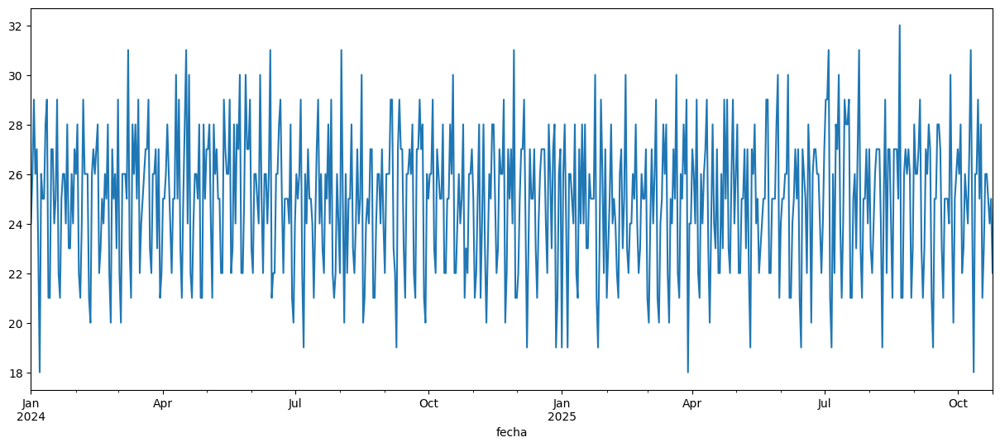

In [13]:
df['productos disponibles'].plot(figsize=(15, 6))

In [14]:
# --- Serie + medias móviles ---
ts = df["productos disponibles"].astype(float)
ma7  = ts.rolling(7,  min_periods=1).mean()
ma28 = ts.rolling(28, min_periods=1).mean()

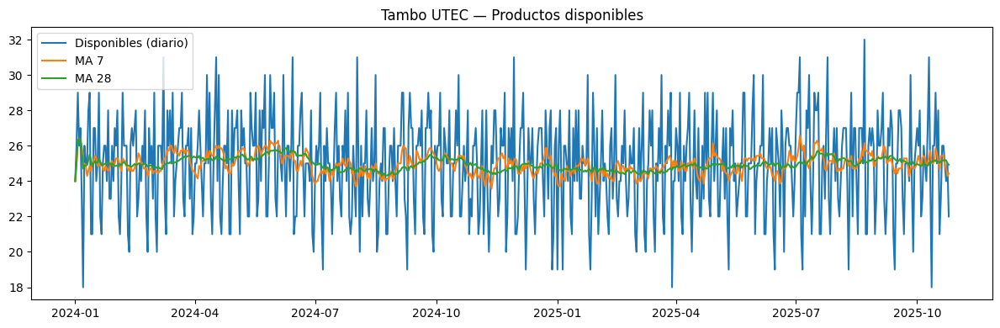

In [15]:
plt.figure(figsize=(12,4))
plt.plot(ts.index, ts.values, label="Disponibles (diario)")
plt.plot(ma7.index, ma7.values, label="MA 7")
plt.plot(ma28.index, ma28.values, label="MA 28")
plt.title("Tambo UTEC — Productos disponibles")
plt.legend()
plt.tight_layout()
plt.show()

> Media de 25 sin tendencia fuerte

> Variabildiad alta por día pero acotada entre 18-32

> Se repiten los picos y valles

> No hace falta estabilizar lavarianza. Nos enfocaremos en semanalidad y lags

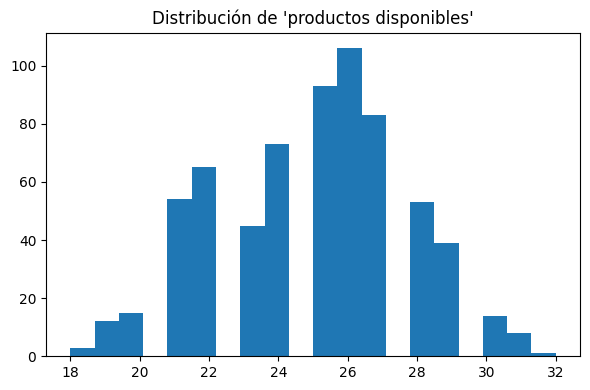

In [16]:
# --- Histograma ---
plt.figure(figsize=(6,4))
plt.hist(ts.dropna().values, bins=20)
plt.title("Distribución de 'productos disponibles'")
plt.tight_layout()
plt.show()

> Aprox simétrico

> Tenemos valores enteros discretos así que podamos usar RMSE

> Recordemos que los árboles manejan mejor valores continuos

/var/folders/4x/33xh0_ps4klghq3bjvtbr31r0000gn/T/ipykernel_61102/2525450679.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_dow, labels=["L","M","X","J","V","S","D"], showfliers=False)


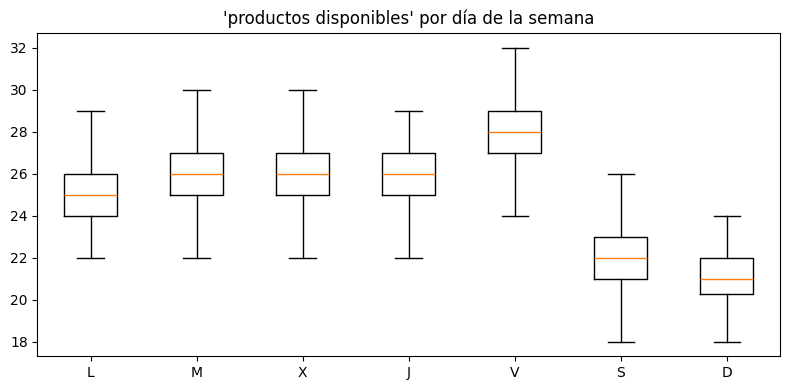

In [17]:
# --- Boxplot por día de la semana ---
data_by_dow = [df[df["dow"]==d]["productos disponibles"].dropna().values for d in range(7)]
plt.figure(figsize=(8,4))
plt.boxplot(data_by_dow, labels=["L","M","X","J","V","S","D"], showfliers=False)
plt.title("'productos disponibles' por día de la semana")
plt.tight_layout()
plt.show()

> Vierenes tiene mayor valor, a diferencia de los finde

> Lunes-Jueves son muy similares

> Podemos considerar lags semanales

In [18]:
df

,id,local,distrito,puntaje google,latitud,longitud,productos disponibles,productos esperados,osa,dow
fecha,,,,,,,,,,
2024-01-01,TUB0001,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,24,37,64.864865,0
2024-01-02,TUB0002,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,26,35,74.285714,1
2024-01-03,TUB0003,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,29,38,76.315789,2
2024-01-04,TUB0004,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,26,36,72.222222,3
2024-01-05,TUB0005,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,27,38,71.052632,4
...,...,...,...,...,...,...,...,...,...,...
2025-10-21,TUB0660,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,26,36,72.222222,1
2025-10-22,TUB0661,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,25,36,69.444444,2
2025-10-23,TUB0662,Tambo UTEC,Barranco,3.4,-12.135885,-77.022519,24,36,66.666667,3


In [19]:
data = df.copy()

In [20]:
# 1) Quitamos columnas constantes/no útiles para un solo local
drop_cols = ["id", "local", "distrito", "puntaje google", "latitud", "longitud"]
data = data.drop(columns=[c for c in drop_cols if c in data.columns], errors="ignore")

# 2) Aseguramos numéricos mínimos
for c in ["productos disponibles", "productos esperados", "osa"]:
    data[c] = pd.to_numeric(data[c], errors="coerce")

# 3) Día de semana en codificación cíclica (si no existe ya 'dow', lo creamos)
if "dow" not in data.columns:
    data["dow"] = data.index.dayofweek
data["dow_sin"] = np.sin(2*np.pi*data["dow"]/7.0)
data["dow_cos"] = np.cos(2*np.pi*data["dow"]/7.0)

# 4) Lags del target y de esperados (corto y semanal)
for L in [1, 2, 3, 7, 14]:
    data[f"disp_lag{L}"] = data["productos disponibles"].shift(L)
for L in [1, 7, 14]:
    data[f"esp_lag{L}"] = data["productos esperados"].shift(L)

# 5) Rolling stats (7 días)
data["disp_roll7_mean"] = data["productos disponibles"].rolling(7).mean()
data["disp_roll7_std"]  = data["productos disponibles"].rolling(7).std()
data["esp_roll7_mean"]  = data["productos esperados"].rolling(7).mean()

# 6) OSA solo en rezagos (evita fuga)
for L in [1, 7, 14]:
    data[f"osa_lag{L}"] = data["osa"].shift(L)

# 7) Objetivos multi-step (t+1 ... t+7)
h = 7
for k in range(1, h+1):
    data[f"y_tplus{k}"] = data["productos disponibles"].shift(-k)

# 8) Limpiamos filas incompletas por lags/targets
sup = data.dropna().copy()

In [21]:
# 9) Definimos X (features) e Y (multi-salida)
Y_cols = [f"y_tplus{k}" for k in range(1, h+1)]
X_cols = [c for c in sup.columns if c not in ["productos disponibles", "productos esperados", "osa", "dow"] + Y_cols]

X = sup[X_cols].astype(float)
Y = sup[Y_cols].astype(float)

# 10) Split temporal: últimas 56 fechas (8 sem) como test
test_days = 56
X_train, X_test = X.iloc[:-test_days], X.iloc[-test_days:]
Y_train, Y_test = Y.iloc[:-test_days], Y.iloc[-test_days:]

print("Nº features:", len(X_cols))
print("Train shapes:", X_train.shape, Y_train.shape)
print("Test  shapes:", X_test.shape,  Y_test.shape)
print("Train hasta:", X_train.index[-1].date(), "| Test desde:", X_test.index[0].date(), "→", X_test.index[-1].date())

Nº features: 16
Train shapes: (587, 16) (587, 7)
Test  shapes: (56, 16) (56, 7)
Train hasta: 2025-08-23 | Test desde: 2025-08-24 → 2025-10-18


In [25]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt


            baseline  RMSE@1  RMSE@7  RMSE_mean(1..7)
1  seasonal_lastweek   3.647   1.890            3.789
2   pattern_lastweek   4.540   1.890            3.818
0         naive_last   4.540   3.593            3.864


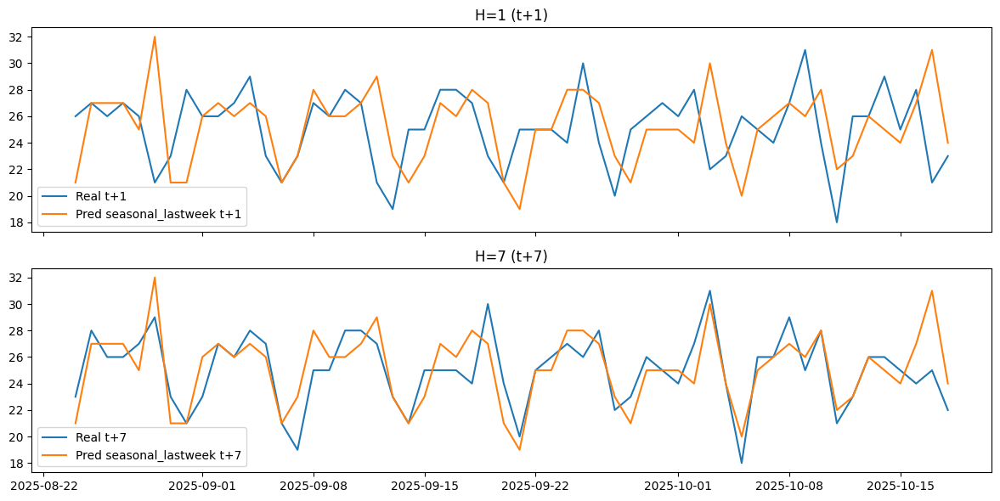

In [26]:
Ycols = [f"y_tplus{k}" for k in range(1, 8)]

def rmse_per_horizon(y_true_df: pd.DataFrame, y_pred: np.ndarray):
    """RMSE por horizonte (k=1..7) y promedio."""
    rmses = []
    for k in range(7):
        mse = mean_squared_error(y_true_df.iloc[:, k], y_pred[:, k])
        rmses.append(np.sqrt(mse))
    return np.array(rmses), float(np.mean(rmses))

# 1) Naive (persistencia: usa disp_lag1 para todos los horizontes)
pred_naive = np.column_stack([X_test["disp_lag1"].values for _ in range(7)])

# 2) Estacional semanal (usa disp_lag7 para todos los horizontes)
pred_seasonal = np.column_stack([X_test["disp_lag7"].values for _ in range(7)])

# 3) Patrón última semana:
#    k -> usa disp_lag{k}; si no existe en tus features, usa disp_lag7 como fallback
pattern_cols = []
for k in range(1, 8):
    col = f"disp_lag{k}"
    if col in X_test.columns:
        pattern_cols.append(X_test[col].values)
    else:
        pattern_cols.append(X_test["disp_lag7"].values)  # fallback
pred_pattern = np.column_stack(pattern_cols)

# --- Evaluación ---
Y_true = Y_test[[f"y_tplus{k}" for k in range(1,8)]]

rmse_naive,    rmse_naive_mean    = rmse_per_horizon(Y_true, pred_naive)
rmse_seasonal, rmse_seasonal_mean = rmse_per_horizon(Y_true, pred_seasonal)
rmse_pattern,  rmse_pattern_mean  = rmse_per_horizon(Y_true, pred_pattern)

res = pd.DataFrame({
    "baseline": ["naive_last", "seasonal_lastweek", "pattern_lastweek"],
    "RMSE@1": [rmse_naive[0], rmse_seasonal[0], rmse_pattern[0]],
    "RMSE@7": [rmse_naive[6], rmse_seasonal[6], rmse_pattern[6]],
    "RMSE_mean(1..7)": [rmse_naive_mean, rmse_seasonal_mean, rmse_pattern_mean],
}).sort_values("RMSE_mean(1..7)")
print(res.round(3))

# Visual rápido del mejor baseline en H=1 y H=7
best_name = res.iloc[0]["baseline"]
best_pred = {"naive_last": pred_naive,
             "seasonal_lastweek": pred_seasonal,
             "pattern_lastweek": pred_pattern}[best_name]

fig, axes = plt.subplots(2, 1, figsize=(12,6), sharex=True)
axes[0].plot(Y_true.index, Y_true["y_tplus1"].values, label="Real t+1")
axes[0].plot(Y_true.index, best_pred[:,0], label=f"Pred {best_name} t+1")
axes[0].set_title("H=1 (t+1)"); axes[0].legend()

axes[1].plot(Y_true.index, Y_true["y_tplus7"].values, label="Real t+7")
axes[1].plot(Y_true.index, best_pred[:,6], label=f"Pred {best_name} t+7")
axes[1].set_title("H=7 (t+7)"); axes[1].legend()

plt.tight_layout(); plt.show()

> Vemos que hay patrón semanal

In [27]:
from sklearn.metrics import mean_squared_error
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor

              modelo  RMSE@1  RMSE@7  RMSE_mean(1..7)
1       RandomForest   1.550   1.525            1.553
2            XGBoost   1.721   1.644            1.678
0  baseline_seasonal   3.647   1.890            3.789


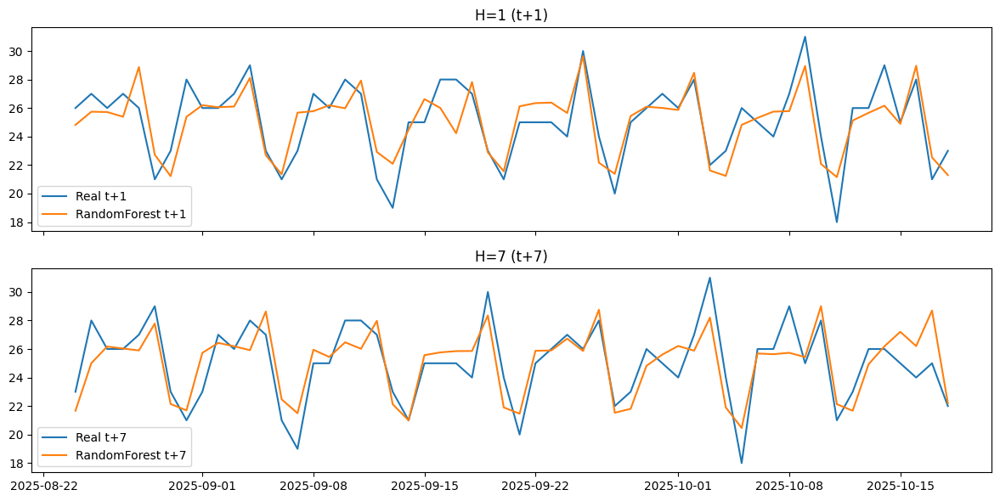


Top 10 features (RF):
        feature  importance
        dow_sin    0.344697
        dow_cos    0.229215
      disp_lag2    0.082954
       esp_lag1    0.062534
 disp_roll7_std    0.040321
       osa_lag7    0.029782
      osa_lag14    0.028582
       osa_lag1    0.027760
 esp_roll7_mean    0.026221
disp_roll7_mean    0.024900


In [28]:
# --- utilidades ---
def rmse_per_horizon(y_true_df: pd.DataFrame, y_pred: np.ndarray):
    rmses = []
    for k in range(y_true_df.shape[1]):
        mse = mean_squared_error(y_true_df.iloc[:, k], y_pred[:, k])
        rmses.append(np.sqrt(mse))
    return np.array(rmses), float(np.mean(rmses))

Ycols = [f"y_tplus{k}" for k in range(1,8)]
Y_true = Y_test[Ycols].copy()

# --- baseline ganador (de tu paso anterior) ---
pred_seasonal = np.column_stack([X_test["disp_lag7"].values for _ in range(7)])
rmse_b, rmse_b_mean = rmse_per_horizon(Y_true, pred_seasonal)

# 1) RandomForest (multi-salida)
rf = MultiOutputRegressor(
    RandomForestRegressor(
        n_estimators=500,
        max_depth=None,
        min_samples_leaf=2,
        random_state=42,
        n_jobs=-1
    )
)
rf.fit(X_train, Y_train)
pred_rf = rf.predict(X_test)
rmse_rf, rmse_rf_mean = rmse_per_horizon(Y_true, pred_rf)

# 2) XGBoost (si está disponible)
try:
    from xgboost import XGBRegressor
    xgb = MultiOutputRegressor(
        XGBRegressor(
            n_estimators=700,
            learning_rate=0.05,
            max_depth=5,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            n_jobs=4,
            tree_method="hist",
        )
    )
    xgb.fit(X_train, Y_train)
    pred_xgb = xgb.predict(X_test)
    rmse_xgb, rmse_xgb_mean = rmse_per_horizon(Y_true, pred_xgb)
    has_xgb = True
except Exception as e:
    print("XGBoost no disponible:", e)
    has_xgb = False

# --- tabla de comparación ---
rows = [
    ("baseline_seasonal", rmse_b[0], rmse_b[-1], rmse_b_mean),
    ("RandomForest",      rmse_rf[0], rmse_rf[-1], rmse_rf_mean),
]
if has_xgb:
    rows.append(("XGBoost", rmse_xgb[0], rmse_xgb[-1], rmse_xgb_mean))

res_models = pd.DataFrame(rows, columns=["modelo","RMSE@1","RMSE@7","RMSE_mean(1..7)"]).sort_values("RMSE_mean(1..7)")
print(res_models.round(3))

# --- curvas para el mejor modelo ---
best_name = res_models.iloc[0]["modelo"]
best_pred = {"baseline_seasonal": pred_seasonal, "RandomForest": pred_rf}
if has_xgb: best_pred["XGBoost"] = pred_xgb
best_pred = best_pred[best_name]

fig, axes = plt.subplots(2, 1, figsize=(12,6), sharex=True)
axes[0].plot(Y_true.index, Y_true["y_tplus1"].values, label="Real t+1")
axes[0].plot(Y_true.index, best_pred[:,0], label=f"{best_name} t+1")
axes[0].set_title("H=1 (t+1)"); axes[0].legend()

axes[1].plot(Y_true.index, Y_true["y_tplus7"].values, label="Real t+7")
axes[1].plot(Y_true.index, best_pred[:,6], label=f"{best_name} t+7")
axes[1].set_title("H=7 (t+7)"); axes[1].legend()
plt.tight_layout(); plt.show()

# --- importancia de variables (si el mejor es RF) ---
if best_name == "RandomForest":
    # promedio de importancias a través de los 7 estimadores internos
    importances = []
    for est in rf.estimators_:
        importances.append(est.feature_importances_)
    importances = np.vstack(importances).mean(axis=0)
    fi = pd.DataFrame({"feature": X_train.columns, "importance": importances}).sort_values("importance", ascending=False)
    print("\nTop 10 features (RF):")
    print(fi.head(10).to_string(index=False))

Forecast 7 días (RF):
       fecha  pred_productos_disponibles
0 2025-10-26                       21.73
1 2025-10-27                       25.63
2 2025-10-28                       25.98
3 2025-10-29                       25.33
4 2025-10-30                       25.73
5 2025-10-31                       27.62
6 2025-11-01                       22.55


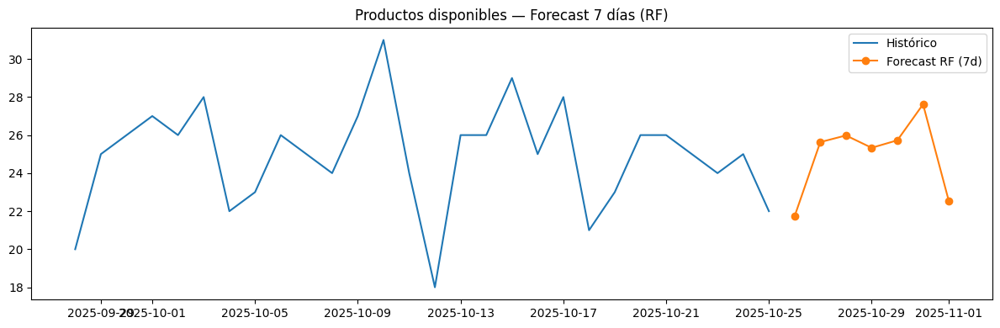

In [34]:
# === Forecast 7 días out-of-sample usando el RF ya entrenado ===
# - df  : DataFrame diario con índice fecha y columnas originales (incluye 'productos disponibles', 'productos esperados', 'osa', 'dow')
# - rf  : mejor modelo (RandomForest envuelto en MultiOutputRegressor)
# - X_train, X_test, Y_train, Y_test existentes
# - Si no tienes X_cols definido, lo tomamos de X_train:
try:
    X_cols
except NameError:
    X_cols = list(X_train.columns)

# 1) Reconstruimos features como antes pero SIN generar targets, para poder tomar la última fila (t = T)
data = df.copy()

# quitamos columnas que no usaremos como features
drop_cols = ["id", "local", "distrito", "puntaje google", "latitud", "longitud"]
data = data.drop(columns=[c for c in drop_cols if c in data.columns], errors="ignore")

# aseguramos numéricos
for c in ["productos disponibles", "productos esperados", "osa"]:
    data[c] = pd.to_numeric(data[c], errors="coerce")

# codificación cíclica del día de semana
if "dow" not in data.columns:
    data["dow"] = data.index.dayofweek
data["dow_sin"] = np.sin(2*np.pi*data["dow"]/7.0)
data["dow_cos"] = np.cos(2*np.pi*data["dow"]/7.0)

# lags y rollings igual que en el dataset supervisado
for L in [1,2,3,7,14]:
    data[f"disp_lag{L}"] = data["productos disponibles"].shift(L)
for L in [1,7,14]:
    data[f"esp_lag{L}"]  = data["productos esperados"].shift(L)

data["disp_roll7_mean"] = data["productos disponibles"].rolling(7).mean()
data["disp_roll7_std"]  = data["productos disponibles"].rolling(7).std()
data["esp_roll7_mean"]  = data["productos esperados"].rolling(7).mean()

for L in [1,7,14]:
    data[f"osa_lag{L}"] = data["osa"].shift(L)

# 2) Tomamos la última fila disponible (t = T) y extraemos solo las columnas de features que el modelo espera
t0 = data.index.max()
X_last = data.loc[[t0], X_cols].astype(float)

# 3) Predecimos horizonte 7
yhat_next7 = rf.predict(X_last)[0]   # shape (7, )

# 4) Armamos la tabla de forecast con fechas futuras
future_dates = pd.date_range(t0 + pd.Timedelta(days=1), periods=7, freq="D")
forecast_df = pd.DataFrame({
    "fecha": future_dates,
    "pred_productos_disponibles": np.round(yhat_next7, 2)
})
print("Forecast 7 días (RF):")
print(forecast_df)

# 5) Plot: últimos 28 días reales + próximos 7 días predichos
hist_window = 28
plt.figure(figsize=(12,4))
plt.plot(df.index[-hist_window:], df["productos disponibles"].iloc[-hist_window:], label="Histórico")
plt.plot(future_dates, yhat_next7, marker="o", label="Forecast RF (7d)")
plt.title("Productos disponibles — Forecast 7 días (RF)")
plt.legend()
plt.tight_layout()
plt.show()

Forecast 7 días (ENTEROS + clip a capacidad):
       fecha  prod_esp_ref  prod_disp_pred  OSA_pred
0 2025-10-26            31              21     67.74
1 2025-10-27            35              26     74.29
2 2025-10-28            36              26     72.22
3 2025-10-29            36              26     72.22
4 2025-10-30            36              26     72.22
5 2025-10-31            36              28     77.78
6 2025-11-01            32              22     68.75


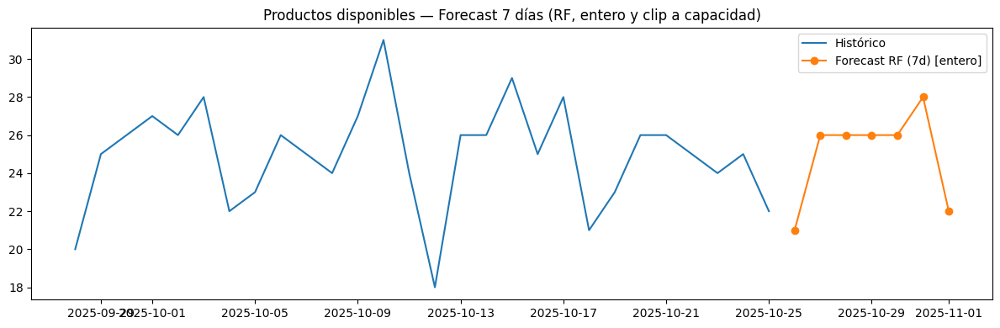

Guardado: /Users/johar/Desktop/Desarrollo/proyecto_dpd/data/bronze/forecast_TAMBO_UTEC_7d.xlsx


In [30]:
# == ENTEROS + CLIP A CAPACIDAD + OSA ==


# yhat_next7: vector float (salida del RF)  shape=(7,)
# t0: última fecha histórica (índice de df)
# df: histórico con columnas "productos disponibles" y "productos esperados"
# Si no tienes yhat_next7/t0/future_dates aún, créalos como en el bloque anterior.

# 1) Fechas futuras (por si no existen)
future_dates = pd.date_range(t0 + pd.Timedelta(days=1), periods=7, freq="D")

# 2) Capacidad futura = "productos esperados" de hace 7 días (misma DOW)
exp_future = []
for d in future_dates:
    ref = d - pd.Timedelta(days=7)
    if ref in df.index:
        exp_future.append(int(df.loc[ref, "productos esperados"]))
    else:
        # fallback: última capacidad conocida
        exp_future.append(int(df["productos esperados"].iloc[-1]))
exp_future = np.array(exp_future, dtype=int)

# 3) Redondeo a entero y recorte a [0, capacidad]
yhat_int = np.rint(yhat_next7).astype(int)             # 20.99 -> 21
yhat_int = np.clip(yhat_int, 0, exp_future)            # no negativos ni > capacidad

# 4) OSA predicha
osa_pred = np.round((yhat_int / exp_future) * 100.0, 2)

# 5) Tabla final
forecast_df = pd.DataFrame({
    "fecha": future_dates,
    "prod_esp_ref": exp_future,
    "prod_disp_pred": yhat_int,
    "OSA_pred": osa_pred
})
print("Forecast 7 días (ENTEROS + clip a capacidad):")
print(forecast_df)

# 6) Plot: últimos 28 días + predicción entera
hist_window = 28
plt.figure(figsize=(12,4))
plt.plot(df.index[-hist_window:], df["productos disponibles"].iloc[-hist_window:], label="Histórico")
plt.plot(future_dates, yhat_int, marker="o", label="Forecast RF (7d) [entero]")
plt.title("Productos disponibles — Forecast 7 días (RF, entero y clip a capacidad)")
plt.legend()
plt.tight_layout()
plt.show()

# 7) (Opcional) Guardar a Excel
out_path = "/Users/johar/Desktop/Desarrollo/proyecto_dpd/data/bronze/forecast_TAMBO_UTEC_7d.xlsx"
forecast_df.to_excel(out_path, index=False)
print("Guardado:", out_path)

In [33]:
# === BACKTEST WALK-FORWARD (8 ventanas de 7 días) ===
# === Backtest rápido: RF multi-output nativo (1 modelo/ventana) ===
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
import numpy as np
import pandas as pd

H = 7
FOLDS = 8            # si aún va lento, prueba FOLDS=5
N_TREES = 300        # si aún va lento, baja a 200

# orígenes: 8 ventanas consecutivas de 7 días
n = len(sup)
origins = [n - FOLDS*H + i*H for i in range(FOLDS)]

sse_rf_by_h = np.zeros(H)
sse_bl_by_h = np.zeros(H)
count = 0

# Cambia a True para aún más velocidad (algo menos de accuracy):
USE_EXTRA_TREES = False
Reg = ExtraTreesRegressor if USE_EXTRA_TREES else RandomForestRegressor

for pos in origins:
    # expansivo hasta el origen
    X_tr, Y_tr = X_all.iloc[:pos], Y_all.iloc[:pos]
    X_o        = X_all.iloc[[pos]]
    y_true_vec = Y_all.iloc[pos].values.astype(float)          # shape (7,)

    # --- Baseline semanal (replicar lag7) ---
    y_pred_bl_vec = np.repeat(float(X_o["disp_lag7"].values[0]), H)

    # --- Modelo multi-output nativo (1 bosque para las 7 salidas) ---
    rf = Reg(
        n_estimators=N_TREES,
        max_depth=None,
        min_samples_leaf=3,
        max_features="sqrt",
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X_tr, Y_tr)                     # Y_tr tiene 7 columnas (multi-output)
    y_pred_rf_vec = rf.predict(X_o)[0].astype(float)

    # --- Acumular SSE vectorial por horizonte ---
    sse_rf_by_h += (y_true_vec - y_pred_rf_vec) ** 2
    sse_bl_by_h += (y_true_vec - y_pred_bl_vec) ** 2
    count += 1

# RMSE por horizonte y promedio
rmse_rf_by_h = np.sqrt(sse_rf_by_h / count)
rmse_bl_by_h = np.sqrt(sse_bl_by_h / count)
rmse_rf_mean = float(rmse_rf_by_h.mean())
rmse_bl_mean = float(rmse_bl_by_h.mean())

res_bt = pd.DataFrame({
    "horizon": [f"t+{k}" for k in range(1, H+1)],
    "RF_RMSE": rmse_rf_by_h,
    "BL_seasonal_RMSE": rmse_bl_by_h
})
print("RMSE por horizonte (promedio ventanas):\n", res_bt.round(3))
print("\nPromedio RMSE RF:", round(rmse_rf_mean,3), " | Baseline:", round(rmse_bl_mean,3))


RMSE por horizonte (promedio ventanas):
   horizon  RF_RMSE  BL_seasonal_RMSE
0     t+1    1.280             4.835
1     t+2    0.890             4.848
2     t+3    1.719             5.385
3     t+4    1.643             5.579
4     t+5    1.620             7.558
5     t+6    1.285             2.693
6     t+7    1.803             1.904

Promedio RMSE RF: 1.463  | Baseline: 4.686


Los bloques anteriores se centraron en el análisis con la data real

- ahora nuestro foco será probar los modelos

In [1]:
import pandas as pd, numpy as np

# === Cargar y preparar base (como ya tienes) ===
PATH = "/Users/johar/Desktop/Desarrollo/proyecto_dpd/data/bronze/osa_hist_Tambo_UTEC.xlsx"

def parse_fecha(x):
    s = str(x).replace(",", "").strip()
    try:
        n = int(float(s))
        return pd.to_datetime(n, unit="D", origin="1899-12-30")
    except:
        return pd.to_datetime(s, errors="coerce")

df = pd.read_excel(PATH)
df.columns = [c.strip().lower() for c in df.columns]
df["fecha"] = df["fecha"].apply(parse_fecha)
df = df.sort_values("fecha").set_index("fecha").asfreq("D")

# numéricos y OSA
df["productos esperados"] = pd.to_numeric(df["productos esperados"], errors="coerce").ffill()
df["productos disponibles"] = pd.to_numeric(df["productos disponibles"], errors="coerce").fillna(0)
df["osa"] = (df["productos disponibles"] / df["productos esperados"] * 100)
df["dow"] = df.index.dayofweek

# === Features (idénticas a tu flujo) ===
data = df.copy()
drop_cols = ["id","local","distrito","puntaje google","latitud","longitud"]
data = data.drop(columns=[c for c in drop_cols if c in data.columns], errors="ignore")
for c in ["productos disponibles","productos esperados","osa"]:
    data[c] = pd.to_numeric(data[c], errors="coerce")

data["dow_sin"] = np.sin(2*np.pi*data["dow"]/7.0)
data["dow_cos"] = np.cos(2*np.pi*data["dow"]/7.0)

for L in [1,2,3,7,14]:
    data[f"disp_lag{L}"] = data["productos disponibles"].shift(L)
for L in [1,7,14]:
    data[f"esp_lag{L}"] = data["productos esperados"].shift(L)

data["disp_roll7_mean"] = data["productos disponibles"].rolling(7).mean()
data["disp_roll7_std"]  = data["productos disponibles"].rolling(7).std()
data["esp_roll7_mean"]  = data["productos esperados"].rolling(7).mean()

for L in [1,7,14]:
    data[f"osa_lag{L}"] = data["osa"].shift(L)

H = 7
for k in range(1, H+1):
    data[f"y_tplus{k}"] = data["productos disponibles"].shift(-k)

sup = data.dropna().copy()

Y_cols = [f"y_tplus{k}" for k in range(1, H+1)]
X_cols = [c for c in sup.columns if c not in ["productos disponibles","productos esperados","osa","dow"] + Y_cols]

X_all = sup[X_cols].astype(float)
Y_all = sup[Y_cols].astype(float)

print("Shapes:", X_all.shape, Y_all.shape)

Shapes: (643, 16) (643, 7)


In [2]:
from typing import Dict, Any
import numpy as np
import pandas as pd

from sklearn.metrics import mean_squared_error
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor

def rmse_per_h(y_true: np.ndarray, y_pred: np.ndarray):
    rmses = np.sqrt(((y_true - y_pred)**2).mean(axis=0))
    return rmses, float(rmses.mean())

# Baselines vectoriales (no entrenan)
def baseline_predict(X_row: pd.Series, kind: str, H: int = 7):
    if kind == "lag1":
        return np.repeat(float(X_row["disp_lag1"]), H)
    if kind == "lag7":
        return np.repeat(float(X_row["disp_lag7"]), H)
    if kind == "pattern":
        out = []
        for k in range(1, H+1):
            col = f"disp_lag{k}"
            out.append(float(X_row[col] if col in X_row.index else X_row["disp_lag7"]))
        return np.array(out)
    raise ValueError(kind)

# Catálogo de modelos
models: Dict[str, Any] = {}

# 1) RF multioutput nativo
models["RF"] = RandomForestRegressor(
    n_estimators=400, max_depth=None, min_samples_leaf=3,
    max_features="sqrt", random_state=42, n_jobs=-1
)

# 2) ExtraTrees multioutput nativo
models["ExtraTrees"] = ExtraTreesRegressor(
    n_estimators=600, min_samples_leaf=3, max_features="sqrt",
    random_state=42, n_jobs=-1
)

# 3) HistGradientBoosting (envolver en MultiOutput)
models["HGB"] = MultiOutputRegressor(
    HistGradientBoostingRegressor(
        max_depth=None, max_iter=500, learning_rate=0.06,
        l2_regularization=1.0, random_state=42
    )
)

# 4) XGBoost
try:
    from xgboost import XGBRegressor
    models["XGB"] = MultiOutputRegressor(
        XGBRegressor(
            n_estimators=700, learning_rate=0.05, max_depth=5,
            subsample=0.9, colsample_bytree=0.9, random_state=42,
            n_jobs=4, tree_method="hist"
        )
    )
except Exception as e:
    print("XGBoost no disponible:", e)

# 5) LightGBM
try:
    from lightgbm import LGBMRegressor
    models["LGBM"] = MultiOutputRegressor(
        LGBMRegressor(
            n_estimators=900, learning_rate=0.05, num_leaves=63,
            subsample=0.8, colsample_bytree=0.9, random_state=42, n_jobs=-1
        )
    )
except Exception as e:
    print("LightGBM no disponible:", e)

# 6) CatBoost
try:
    from catboost import CatBoostRegressor
    models["CatBoost"] = MultiOutputRegressor(
        CatBoostRegressor(
            iterations=1000, depth=6, learning_rate=0.05,
            loss_function="RMSE", random_seed=42, verbose=False
        )
    )
except Exception as e:
    print("CatBoost no disponible:", e)

print("Modelos a evaluar:", list(models.keys()))

Modelos a evaluar: ['RF', 'ExtraTrees', 'HGB', 'XGB', 'LGBM', 'CatBoost']


In [3]:
from collections import defaultdict

H = 7
FOLDS = 8  # ajusta si tu serie es corta/larga

n = len(X_all)
origins = [n - FOLDS*H + i*H for i in range(FOLDS)]  # últimos 8*7 puntos como backtest

results_sse = {name: np.zeros(H) for name in ["baseline_lag1","baseline_lag7","baseline_pattern", *models.keys()]}
count = 0

for pos in origins:
    X_tr, Y_tr = X_all.iloc[:pos], Y_all.iloc[:pos]
    X_o        = X_all.iloc[[pos]]
    y_true_vec = Y_all.iloc[pos].values.astype(float)  # (7,)

    # --- baselines ---
    for bname in ["baseline_lag1","baseline_lag7","baseline_pattern"]:
        kind = {"baseline_lag1":"lag1","baseline_lag7":"lag7","baseline_pattern":"pattern"}[bname]
        y_pred_vec = baseline_predict(X_o.iloc[0], kind, H=H)
        results_sse[bname] += (y_true_vec - y_pred_vec)**2

    # --- modelos entrenables ---
    for name, est in models.items():
        est_fit = est  # scikit clona internamente si hace falta; si no, crea uno nuevo si prefieres
        est_fit.fit(X_tr, Y_tr)
        y_pred_vec = est_fit.predict(X_o)[0].astype(float)
        results_sse[name] += (y_true_vec - y_pred_vec)**2

    count += 1

# RMSE por horizonte y tabla resumen
rows = []
for name, sse in results_sse.items():
    rmse_h = np.sqrt(sse / count)
    rows.append((name, rmse_h[0], rmse_h[-1], float(rmse_h.mean())))

res_bt = pd.DataFrame(rows, columns=["modelo","RMSE@1","RMSE@7","RMSE_mean(1..7)"]).sort_values("RMSE_mean(1..7)")
print(res_bt.round(3))
best_name = res_bt.iloc[0]["modelo"]
best_name

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 525
[LightGBM] [Info] Number of data points in the train set: 587, number of used features: 16
[LightGBM] [Info] Start training from score 24.940375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

'ExtraTrees'

In [4]:
# LightGBM afinado (envolver en MultiOutputRegressor como antes)
from lightgbm import LGBMRegressor
from sklearn.multioutput import MultiOutputRegressor

lgbm_tuned = MultiOutputRegressor(
    LGBMRegressor(
        n_estimators=1200,
        learning_rate=0.03,
        num_leaves=127,          # más capacidad de árbol
        min_child_samples=5,     # bajar umbral por hoja
        subsample=0.9,
        colsample_bytree=0.9,
        reg_alpha=0.0,
        reg_lambda=0.0,
        random_state=42,
        n_jobs=-1
    )
)

# XGBoost afinado
from xgboost import XGBRegressor
xgb_tuned = MultiOutputRegressor(
    XGBRegressor(
        n_estimators=1200,
        learning_rate=0.03,
        max_depth=6,
        subsample=0.9,
        colsample_bytree=0.9,
        reg_alpha=0.0,
        reg_lambda=1.0,
        random_state=42,
        n_jobs=4,
        tree_method="hist"
    )
)

In [5]:
# 1) Agregar los modelos tuned
models["LGBM_tuned"] = lgbm_tuned
models["XGB_tuned"]  = xgb_tuned

# 2) Backtest walk-forward (mismo esquema que ya usaste)

H = 7
FOLDS = 8  # o ajusta si quieres más/menos ventanas

n = len(X_all)
origins = [n - FOLDS*H + i*H for i in range(FOLDS)]

def baseline_predict(X_row: pd.Series, kind: str, H: int = 7):
    if kind == "lag1": return np.repeat(float(X_row["disp_lag1"]), H)
    if kind == "lag7": return np.repeat(float(X_row["disp_lag7"]), H)
    if kind == "pattern":
        out = []
        for k in range(1, H+1):
            col = f"disp_lag{k}"
            out.append(float(X_row[col] if col in X_row.index else X_row["disp_lag7"]))
        return np.array(out)
    raise ValueError(kind)

results_sse = {name: np.zeros(H) for name in ["baseline_lag1","baseline_lag7","baseline_pattern", *models.keys()]}
count = 0

for pos in origins:
    X_tr, Y_tr = X_all.iloc[:pos], Y_all.iloc[:pos]
    X_o        = X_all.iloc[[pos]]
    y_true_vec = Y_all.iloc[pos].values.astype(float)

    # baselines
    for bname, kind in [("baseline_lag1","lag1"), ("baseline_lag7","lag7"), ("baseline_pattern","pattern")]:
        y_pred_vec = baseline_predict(X_o.iloc[0], kind, H=H)
        results_sse[bname] += (y_true_vec - y_pred_vec)**2

    # modelos
    for name, est in models.items():
        est_fit = est
        est_fit.fit(X_tr, Y_tr)
        y_pred_vec = est_fit.predict(X_o)[0].astype(float)
        results_sse[name] += (y_true_vec - y_pred_vec)**2

    count += 1

rows = []
for name, sse in results_sse.items():
    rmse_h = np.sqrt(sse / count)
    rows.append((name, rmse_h[0], rmse_h[-1], float(rmse_h.mean())))

res_bt = pd.DataFrame(rows, columns=["modelo","RMSE@1","RMSE@7","RMSE_mean(1..7)"]).sort_values("RMSE_mean(1..7)")
print(res_bt.round(3))

best_name = res_bt.iloc[0]["modelo"]
print( "Mejor modelo en backtest:", best_name)

# Ver RMSE por horizonte de los top-3
top3 = res_bt.head(3)["modelo"].tolist()
for m in top3:
    rmse_h = np.sqrt(results_sse[m] / count)
    print(f"\n{m} — RMSE por horizonte:")
    for k, v in enumerate(rmse_h, start=1):
        print(f"  t+{k}: {v:.3f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 525
[LightGBM] [Info] Number of data points in the train set: 587, number of used features: 16
[LightGBM] [Info] Start training from score 24.940375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

> LGBM_tuned dio RMSE@7 bajo pero RMSE@1 alto 

> Indica que el booster captó mejor la semana que el corto plazo